https://github.com/ultralytics/ultralytics/issues/2066

In [1]:
#!pip install ultralytics==8.0.28
!pip install ultralytics

!pip install gdown 

from IPython import display
display.clear_output()

In [2]:

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.112 🚀 Python-3.10.11 torch-2.0.0 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (8 CPUs, 30.9 GB RAM, 30.7/193.8 GB disk)


In [3]:
!nvidia-smi

Sat Jun  3 09:30:53 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            On   | 00000000:00:1E.0 Off |                    0 |
| N/A   38C    P8     9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
! pip install -q kaggle

! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json


mkdir: cannot create directory ‘/home/ubuntu/.kaggle’: File exists


In [1]:
import zipfile
import os

if os.path.isdir("BUU-LSPINE (Vertebral position)") == False :
   print("Downloading...")
   !kaggle competitions download -c lumbar

   zip_output = "lumbar.zip"

   if not os.path.isfile(zip_output) :
      with zipfile.ZipFile(zip_output, 'r') as zip_ref:
               zip_ref.extractall('.')

In [5]:
import os
import pandas as pd
import numpy as np
import random

def create_label_dataframe(image_files):
    labels = []
    csvs   = []
    for file_path in image_files:
        # Assuming the folder containing the image file is the label
        label = os.path.basename(os.path.dirname(file_path))
        csv_file = file_path.replace('.jpg','.csv')
        labels.append(label)
        csvs.append(csv_file)

    data = {'img_Path': image_files , 'Label': labels}
    df = pd.DataFrame(data)
    return df

def find_image_files(folder_path):
    image_files = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif')):
                image_files.append(os.path.join(root, file))
    return image_files


folder_path = "BUU-LSPINE (Vertebral position)/train"  # Replace with the actual folder path


image_files = find_image_files(folder_path)
df = create_label_dataframe(image_files)
df['index'] = df['Label'].map({'AP':0,'LA':1})



df =df[df['Label']=='AP']

df

,img_Path,Label,index
0,BUU-LSPINE (Vertebral position)/train/AP/173_A...,AP,0
1,BUU-LSPINE (Vertebral position)/train/AP/32_AP...,AP,0
2,BUU-LSPINE (Vertebral position)/train/AP/110_A...,AP,0
3,BUU-LSPINE (Vertebral position)/train/AP/51_AP...,AP,0
4,BUU-LSPINE (Vertebral position)/train/AP/20_AP...,AP,0
...,...,...,...
395,BUU-LSPINE (Vertebral position)/train/AP/286_A...,AP,0
396,BUU-LSPINE (Vertebral position)/train/AP/398_A...,AP,0
397,BUU-LSPINE (Vertebral position)/train/AP/298_A...,AP,0
398,BUU-LSPINE (Vertebral position)/train/AP/152_A...,AP,0


In [43]:

def ReadAllBox_csv(img_file):

    csv_file = img_file.replace('.jpg','.csv')

    data = np.loadtxt(csv_file, delimiter=',', dtype=np.float32)

    D   = []
    Cls = []
    for i in range(0,10,2) :
        d = np.array(data[i,:-1].tolist()+ data[i+1,2:4].tolist() + data[i+1,0:2].tolist() )
        cls =i/2
        Cls.append(cls)
        D.append(d)
    return np.array(D)


img_file = random.choice(df['img_Path'].tolist())
D        =  ReadAllBox_csv(img_file)

D.shape

(5, 8)

In [39]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2


def draw_line_Up(image_cv, Line , color, thickness):

    Hight,Weight      = image_cv.shape[:2]
    x0, y0, x1, y1    = Line 
    x0,y0,x1,y1       = x0*Weight,y0*Hight,x1*Weight,y1*Hight

    # Draw a line using OpenCV
    start_point = (int(x0), int(y0))
    end_point = (int(x1), int(y1))
    cv2.line(image_cv, start_point, end_point, color, thickness)
    return image_cv

def draw_line_Down(image_cv, Line , color, thickness):

    Hight,Weight      = image_cv.shape[:2]
    x1, y1, x0, y0    = Line 
    x0,y0,x1,y1       = x0*Weight,y0*Hight,x1*Weight,y1*Hight

    # Draw a line using OpenCV
    start_point = (int(x0), int(y0))
    end_point = (int(x1), int(y1))
    cv2.line(image_cv, start_point, end_point, color, thickness)
    return image_cv


def  draw_box(image_cv, D , color, thickness):
   
    draw_line_Up(image_cv,D[0:4], color, thickness)
    draw_line_Down(image_cv,D[4:], color, thickness)
   
    return image_cv





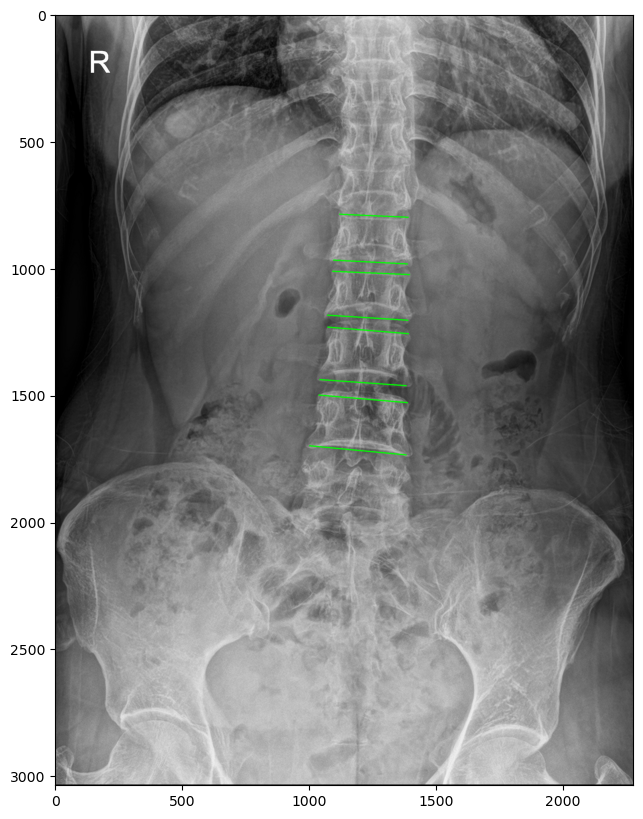

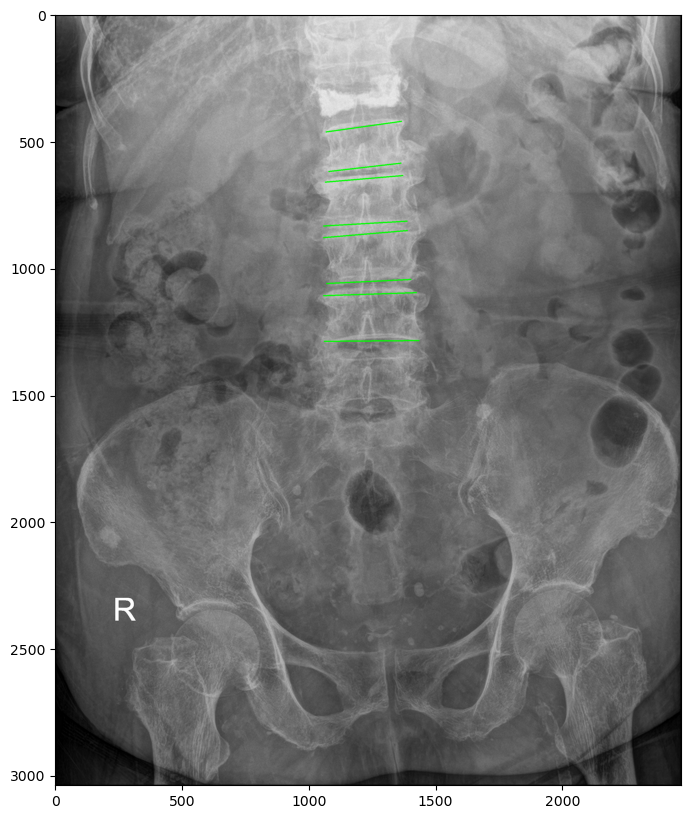

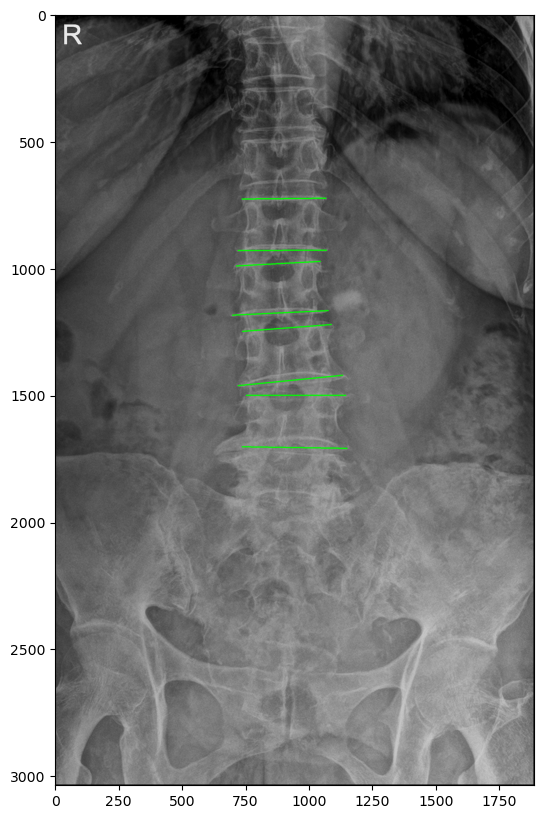

In [40]:
import random

for j in range(3) :

    img_file = random.choice(df['img_Path'].tolist())
    image_cv          = cv2.imread(img_file)
    D                 =  ReadAllBox_csv(img_file)

    for i in range(4) :
      image = draw_box(image_cv, D[i] , (0,255,0), 3)

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

In [37]:
def create_txt_yolo(savepath,img_file):
     
     output_file = savepath +"/" + os.path.basename(img_file).replace('.jpg','.txt') 
     D = ReadAllBox_csv(img_file)
     with open(output_file, 'w') as f:
        for cls in range(len(D)):
            line = f'{0}'
            for j in range(8):
                line += f' {D[cls][j]:.18f}'
            line += '\n'    

            f.write(line)


df0 =df.loc[0:1]

Z = df0['img_Path'].apply(lambda x: create_txt_yolo('.',x))

In [12]:
df

,img_Path,Label,index
400,BUU-LSPINE (Vertebral position)/train/AP/375_A...,AP,0
401,BUU-LSPINE (Vertebral position)/train/AP/344_A...,AP,0
402,BUU-LSPINE (Vertebral position)/train/AP/310_A...,AP,0
403,BUU-LSPINE (Vertebral position)/train/AP/76_AP...,AP,0
404,BUU-LSPINE (Vertebral position)/train/AP/84_AP...,AP,0
...,...,...,...
795,BUU-LSPINE (Vertebral position)/train/AP/379_A...,AP,0
796,BUU-LSPINE (Vertebral position)/train/AP/211_A...,AP,0
797,BUU-LSPINE (Vertebral position)/train/AP/37_AP...,AP,0
798,BUU-LSPINE (Vertebral position)/train/AP/139_A...,AP,0


In [13]:
import shutil

mode = "train"

def Create_Yolo_Dataset(mode='train', df =df):

    if not os.path.exists("datasets"):
        os.mkdir("datasets")   
        
        
    mainfloder = f"./datasets/{mode}"
    main_image_floder = f"{mainfloder}/images"
    main_label_floder = f"{mainfloder}/labels"

    if not os.path.exists(mainfloder):
        os.mkdir(mainfloder)
    if not os.path.exists(main_image_floder):
        os.mkdir(main_image_floder)
    if not os.path.exists(main_label_floder):
        os.mkdir(main_label_floder)

    # copy image
    df['img_Path'].apply(lambda x: shutil.copy(x, main_image_floder+"/"+os.path.basename(x)))  

    # Copy label
    df['img_Path'].apply(lambda x: create_txt_yolo(main_label_floder,x))



if os.path.exists("datasets"):
     shutil.rmtree("datasets")

Create_Yolo_Dataset(mode='train', df =df)   
Create_Yolo_Dataset(mode='test', df =df)   

In [14]:
import yaml

data = {
    'train': './train/images', # Path to the directory containing training images
    'val': './test/images', # Path to the directory containing validation images
    'names': ['Lumbar']# List of class names
}

with open('dataset.yaml', 'w') as outfile:
    yaml.dump(data, outfile)

In [15]:
from ultralytics import YOLO
import torch


import multiprocessing

def get_cpu_core_count():
    return multiprocessing.cpu_count()


model = YOLO("yolov8m-seg.pt")


model_params = {
    'data': "dataset.yaml",
    'epochs': 30,
    'batch': 25,
    'imgsz': 640,
    'device': '0' if torch.cuda.is_available() else "cpu",
    'lr0':0.005,
    'lrf':0.005,
   
     'workers': 8,
     #'resume':True,

    'name': 'Y2_20.5_',
    'plots': True,
    'save': True,

    #'close_mosaic':5,
    "hsv_h": 0.015, # image HSV-Hue augmentation (fraction)
    "hsv_s": 0.7, # image HSV-Saturation augmentation (fraction)
    "hsv_v": 0.4, # image HSV-Value augmentation (fraction)
    "degrees": 10, # image rotation (+/- deg)
    "translate": 0.35, # image translation (+/- fraction)
    "scale": 0.85, # image scale (+/- gain)
    "shear": 5, # image shear (+/- deg)
    "perspective": 0, # image perspective (+/- fraction), range 0-0.001
    "flipud": 0, # image flip up-down (probability)
    "fliplr": 0, # image flip left-right (probability)
    "mosaic": 0.25, # image mosaic (probability)
    "mixup": 0.25, # image mixup (probability)
    "copy_paste": 0, # segment copy-paste (probability),
    
    } 

model_params['workers'] = get_cpu_core_count() if model_params['device']=='0'  else 2
                      
       
model_params

{'data': 'dataset.yaml',
 'epochs': 30,
 'batch': 25,
 'imgsz': 640,
 'device': '0',
 'lr0': 0.005,
 'lrf': 0.005,
 'workers': 8,
 'name': 'Y2_20.5_',
 'plots': True,
 'save': True,
 'hsv_h': 0.015,
 'hsv_s': 0.7,
 'hsv_v': 0.4,
 'degrees': 10,
 'translate': 0.35,
 'scale': 0.85,
 'shear': 5,
 'perspective': 0,
 'flipud': 0,
 'fliplr': 0,
 'mosaic': 0.25,
 'mixup': 0.25,
 'copy_paste': 0}

In [16]:


results = model.train( **model_params)

Ultralytics YOLOv8.0.112 🚀 Python-3.10.11 torch-2.0.0 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=segment, mode=train, model=yolov8m-seg.pt, data=dataset.yaml, epochs=30, patience=50, batch=25, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=Y2_20.5_, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simpli

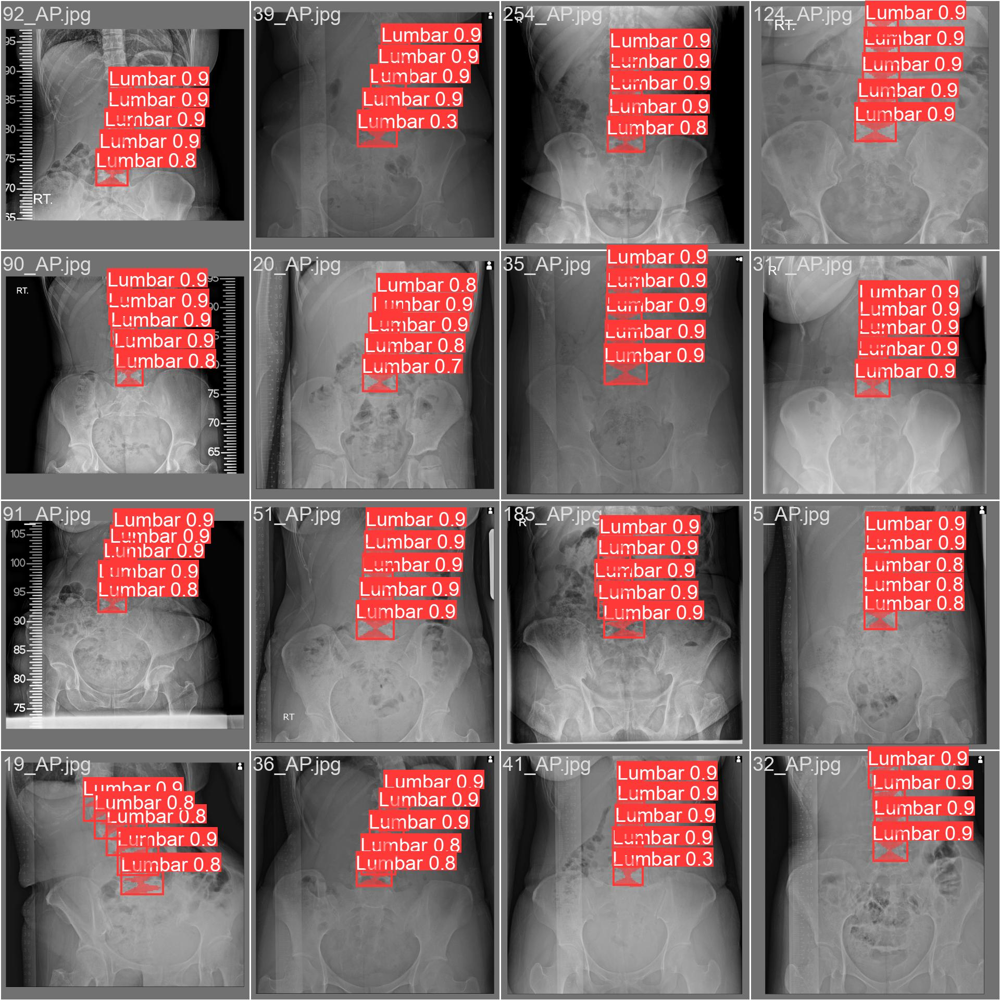

In [19]:
from IPython.display import display, Image
import os

Name_experiment = "Y2_20.5_2"

file_path = f'/content/runs/segment/{Name_experiment}/val_batch0_pred.jpg'
Image(filename=f'./runs/segment/{Name_experiment}/val_batch0_pred.jpg', width=1200)

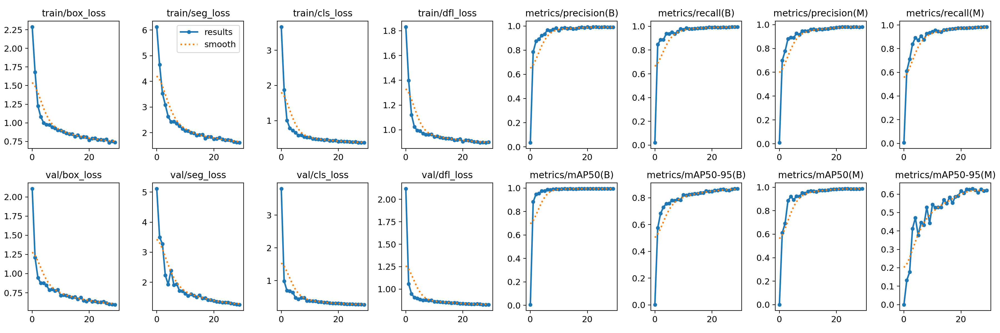

In [20]:
import os
from IPython.display import display, Image

file_path = f'./runs/segment/{Name_experiment}/results.png'

if os.path.exists(file_path):
    display(Image(filename=file_path, width=1200))
else:
    print("File does not exist")


In [43]:
def find_image_files(folder_path):
    image_files = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif')):
                image_files.append(os.path.join(root, file))
    return image_files


path = "BUU-LSPINE (Vertebral position)/train/AP"

LAPfiles = find_image_files(path)


In [35]:
!pwd

/home/ubuntu/Lumbar-Spine-zero


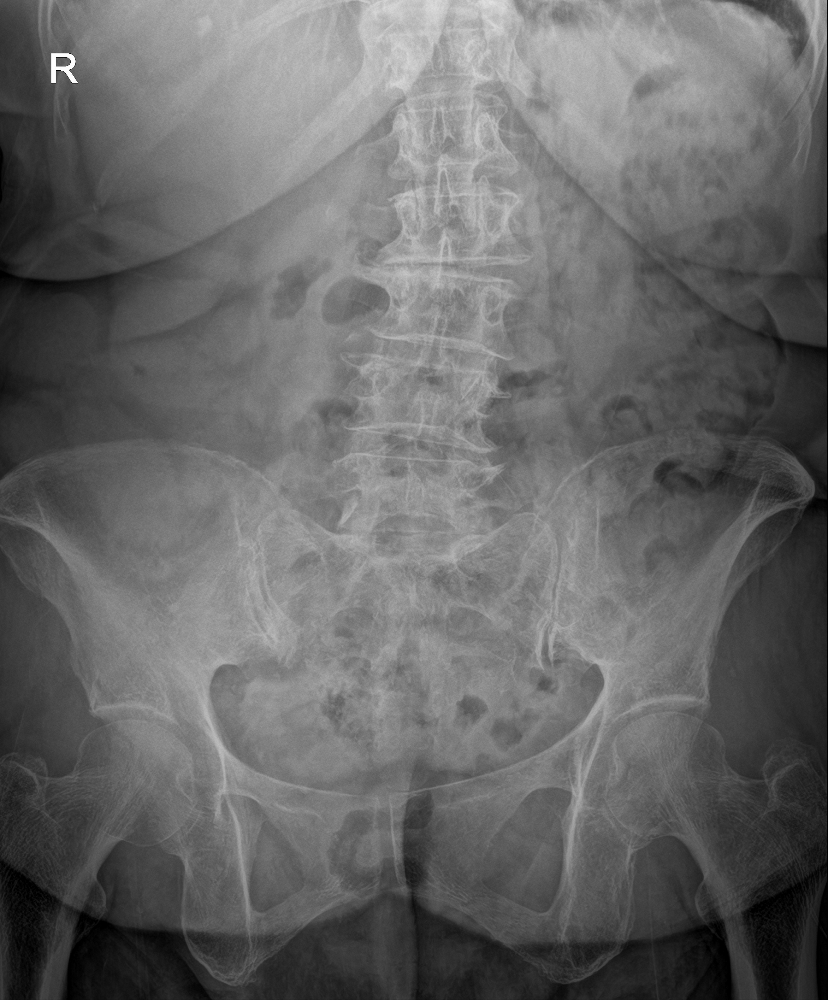

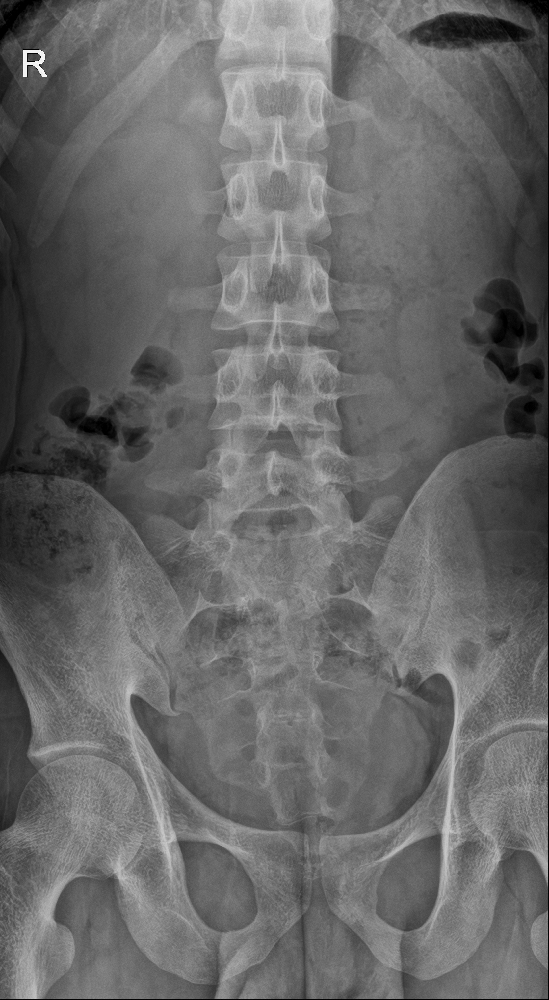

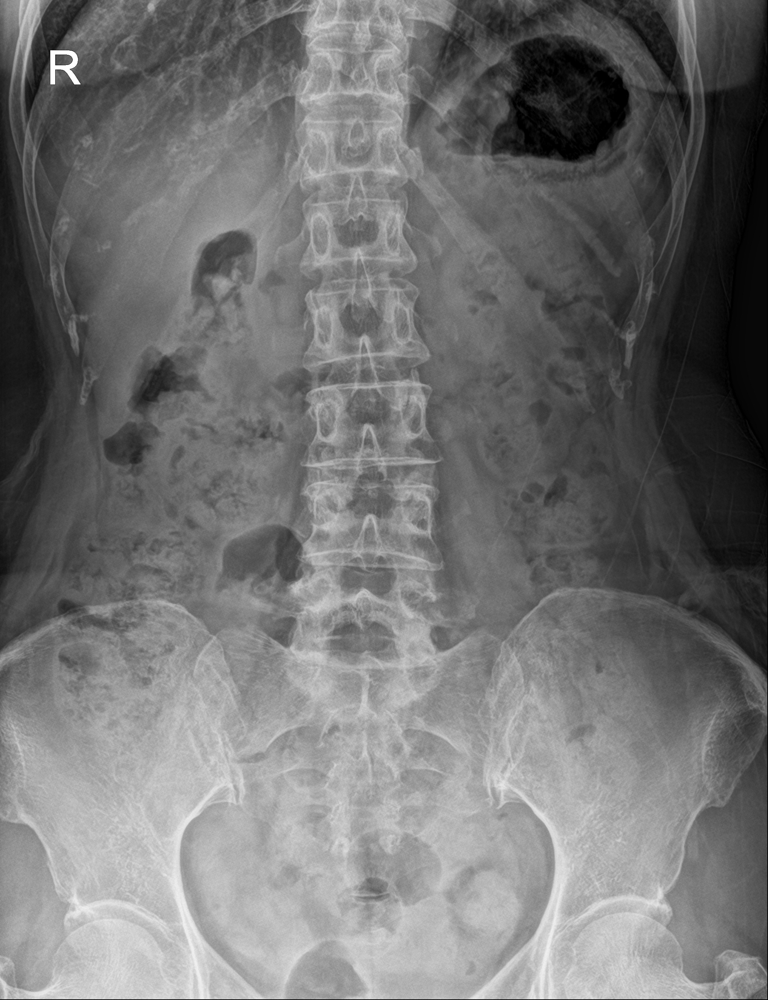

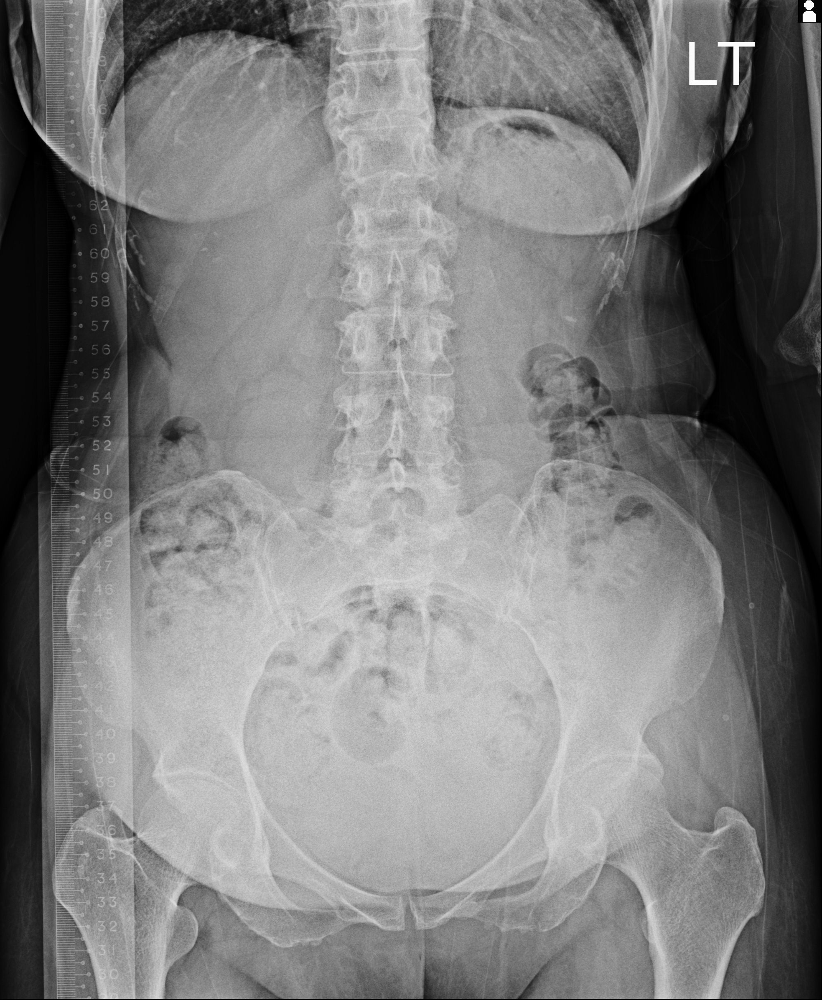

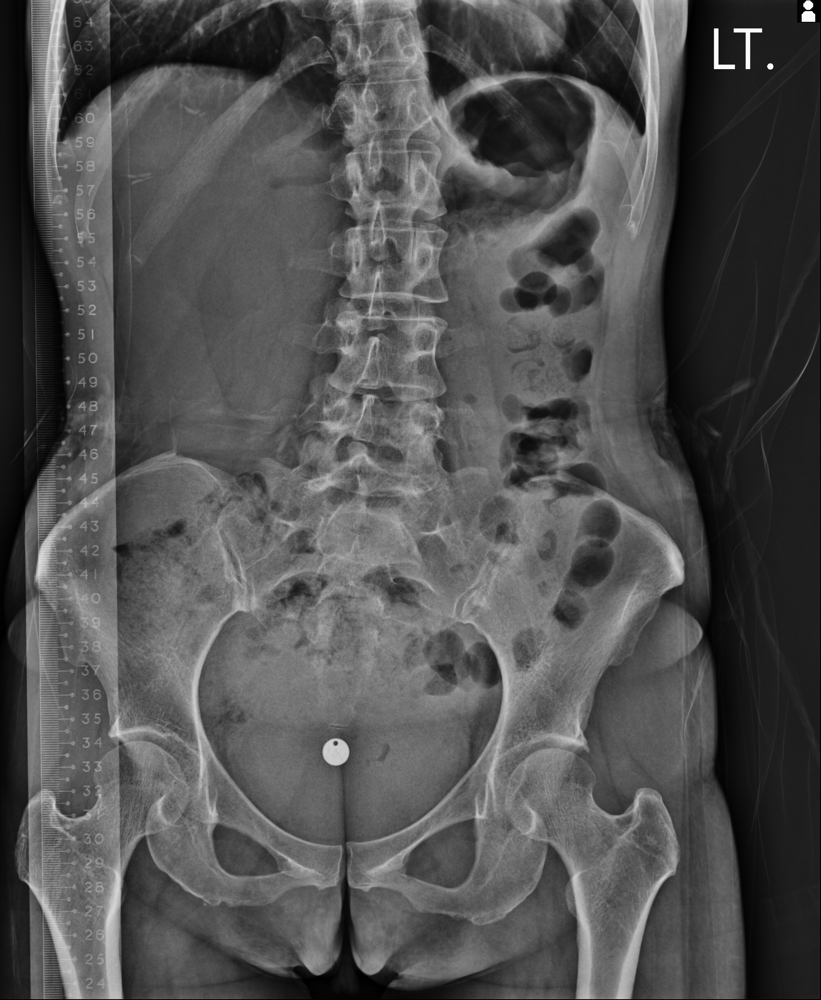

In [45]:
import glob
from IPython.display import Image, display

for image_path in LAPfiles[:5]:
      display(Image(filename=image_path, width=500))
      print("\n")

In [47]:
from ultralytics import YOLO
import numpy as np
import torch



model = YOLO('./runs/segment/Y2_20.5_2/weights/best.pt')
model

In [117]:
 cv2.contourArea(L[0])

31147.894775390625

In [122]:
contour = L[0]
epsilon = 0.02 * cv2.arcLength(contour, True)
approx = cv2.approxPolyDP(contour, epsilon, True)



array([[     1132.2,      305.11]], dtype=float32)

In [123]:
len(approx) 

6

In [120]:
epsilon

25.704519023895266


image 1/1 /home/ubuntu/Lumbar-Spine-zero/BUU-LSPINE (Vertebral position)/train/AP/375_AP.jpg: 640x544 5 Lumbars, 268.2ms
Speed: 2.8ms preprocess, 268.2ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)


1
2
3
4


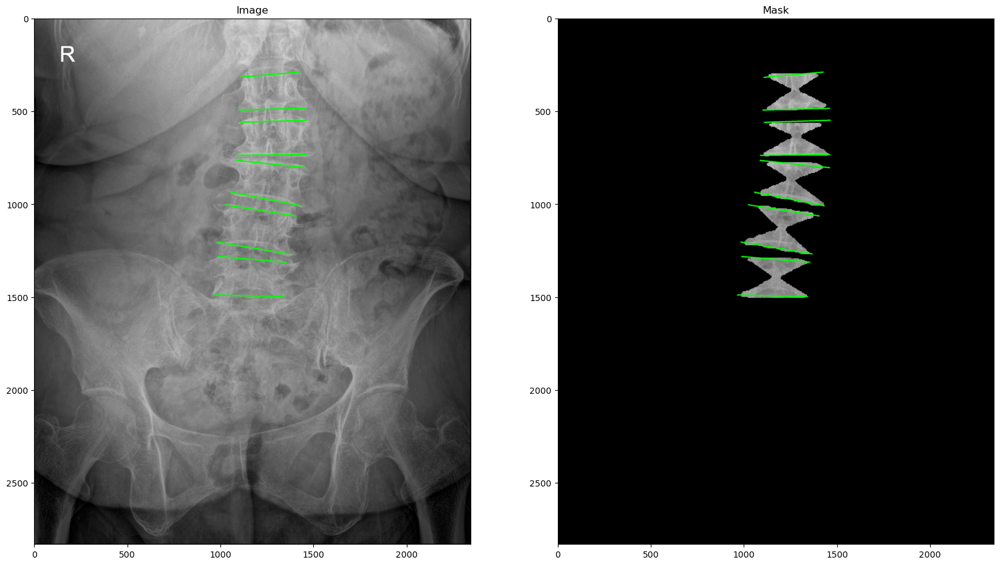

In [112]:

for file in LAPfiles[:1] :

    resutls      = model.predict(file, conf=0.5,device= '0')
    All_masking  = resutls[0].masks.data.numpy()
 
    D       = ReadAllBox_csv(file)

    
    # Load the image and mask
    img     = cv2.imread(file) 
    ximg    = img.copy()
   
    for i in range(5) :
      img = draw_box(img, D[i] , (0,255,0), 5)

    
  
    plt.figure(figsize=(20, 20))
    # Plot the image
    plt.subplot(121)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Image')

  
   
    
  

    
    for k in range(1,len(All_masking),1) :
        print(k)
        if k == 1 : 
          masking = cv2.bitwise_or(All_masking[k],All_masking[k-1])
        else :    
          masking = cv2.bitwise_or(All_masking[k],masking)
            
    masking = cv2.resize(masking, (img.shape[1],img.shape[0]  ))
    masking =  (masking*255).astype(np.uint8)    
    ximg    = cv2.bitwise_and(ximg, ximg , mask=masking)
        
    for i in range(5) :
      ximg = draw_box(ximg, D[i] , (0,255,0), 5)
    
    # Plot the mask
    plt.subplot(122)
    plt.imshow(ximg, cmap='gray')
    plt.title('Mask')



In [75]:
L = resutls[0].masks.xy

L[0]

array([[     942.18,      1086.6],
       [      937.8,      1090.9],
       [     907.13,      1090.9],
       [     902.75,      1095.3],
       [     898.37,      1095.3],
       [     893.99,      1099.7],
       [     885.23,      1099.7],
       [     880.84,      1104.1],
       [     876.46,      1104.1],
       [     872.08,      1108.5],
       [     876.46,      1112.8],
       [     880.84,      1112.8],
       [     885.23,      1117.2],
       [     893.99,      1117.2],
       [     898.37,      1121.6],
       [     902.75,      1121.6],
       [     911.51,      1130.4],
       [     915.89,      1130.4],
       [     920.28,      1134.7],
       [     933.42,      1134.7],
       [      937.8,      1139.1],
       [     942.18,      1139.1],
       [     950.94,      1147.9],
       [     955.33,      1147.9],
       [     959.71,      1152.3],
       [     964.09,      1152.3],
       [     968.47,      1156.7],
       [     972.85,      1156.7],
       [     977.23,

# Clear 

In [17]:

# if os.path.exists("datasets"):
#      shutil.rmtree("datasets")